In [1]:
#!/usr/bin/env python

import argparse
import os
import sys
from dataclasses import dataclass


import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import savemat
from scipy.integrate import solve_ivp


THIS_DIR = os.path.dirname(os.path.abspath("__file__"))
PARENT_DIR = os.path.dirname(os.path.dirname(os.path.abspath("__file__")))
sys.path.append(PARENT_DIR)

import data_gen
import data_gen_dissipative

import modules_quad_stable as module
import plots_helper as plot
import utils

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if device.type == "cpu":
    print("No GPU found!")
else:
    print("Great, a GPU is there")
print("=" * 50)

# For reproducibility
utils.reproducibility_seed(seed=42)

# Plotting setting
prop_cycle = plt.rcParams["axes.prop_cycle"]
colors = prop_cycle.by_key()["color"]

plt.rc("font", size=20)  # controls default text size
plt.rc("axes", titlesize=20)  # fontsize of the title
plt.rc("axes", labelsize=20)  # fontsize of the x and y labels
plt.rc("xtick", labelsize=20)  # fontsize of the x tick labels
plt.rc("ytick", labelsize=20)  # fontsize of the y tick labels
plt.rc("legend", fontsize=15)  # fontsize of the legend

# Define the parameters
@dataclass
class Parameters:
    """It contain necessary parameters for this example."""

    t_train: float = 25.0  # Training final time
    t_test: float = 25.0  # Testing final time
    Nt: int = 25  # Number initial conditions of training samples
    Ntest: int = 100  # Number initial conditions of testing samples
    canonical_dim: int = 2 # canonical dimension
#     latent_dim: int = 2 # latent canonical dimensional
    hidden_dim: int = 16 # number of neurons in a hidden layer
    smpling_intl = [-3, 3]  # sampling interval
    sample_size: int = 100 # number of samples in a given training time interval
    batch_size: int = 64 # batch size
    max_potential: float = 2 # max potential to generate training data
    learning_rate: float = 3e-3  # Learning rate
    encoder: str = "MLP" # type of neural network
    confi_model: str = None # model configuration
    epoch: int = None # number of epochs which are externally controlled
    path: str = None # path where the results will be save and it is also externally controlled
    loss_weights: tuple = (1.0, 1.0)

Great, a GPU is there


In [2]:
# Prepare learned models for integration
def learned_model(t, x):
    """It yields time-derivative of x at time t.
    It is obtained throught the time-derivative of Hamiltonian function.

    Args:
        t (float): time
        x (float): state variable containing position and momenta.

    Returns:
        float: time-derivative of x
    """
    x = torch.tensor(
        x.reshape(-1, params.latent_dim), dtype=torch.float64, requires_grad=True
    ).to(device)
    y = vf.vector_field(x)
    y = y.detach()
    return y.cpu().numpy()

In [3]:
# def plot_soln_phasespace(soln, color="k", title="ground truth", **kwargs):

#     fig, ax = plt.subplots(1, 1, figsize=(4, 3))
#     ax.plot(soln.T[:, 0], soln.T[:, 1], color=color)
#     plt.xlabel("q")
#     plt.ylabel("p")
#     plt.title(title)
#     plt.tight_layout()

#     return fig

# def save_figs_phasespace(plt_ground_truth, plt_learned, idx, path=""):
#     plt_ground_truth.savefig(
#         path + f"plot_groundtruth_ps_{idx}.png",
#         dpi=300,
#         bbox_inches="tight",
#         pad_inches=0.1,
#     )
#     plt_ground_truth.savefig(
#         path + f"plot_groundtruth_ps_{idx}.pdf", bbox_inches="tight", pad_inches=0.1
#     )
#     plt_learned.savefig(
#         path + f"plot_learned_ps_{idx}.png",
#         dpi=300,
#         bbox_inches="tight",
#         pad_inches=0.1,
#     )
#     plt_learned.savefig(
#         path + f"plot_learned_ps_{idx}.pdf", bbox_inches="tight", pad_inches=0.1
#     )

def plotting_saving_plots_phasespace(
    gt_sol,
    decoded_latent_sol,
    color_idx,
    method_name,
    idx,
    path="",
    closing_plts=True,
):
#     plt_ground_truth = plot_soln_phasespace(gt_sol, color=colors[0])
    
    fig, ax = plt.subplots(1, 1, figsize=(4, 3))
    ax.plot(gt_sol.T[:, 0], gt_sol.T[:, 1], linestyle = 'None', marker = 'o', markevery = 10, color='k')
    plt.xlabel("q")
    plt.ylabel("p")
#     plt.title("ground truth")
#     plt.tight_layout()
    
    
#     plt_learned = plot_soln_phasespace(
#         decoded_latent_sol, color=colors[color_idx], title=method_name
#     )
    
#     plt_learned, ax = plt.subplots(1, 1, figsize=(4, 3))
    ax.plot(decoded_latent_sol.T[:, 0], decoded_latent_sol.T[:, 1], color=colors[color_idx])
    plt.title(method_name)
    plt.tight_layout()
    

    fig.savefig(
        path + f"plot_learned_ps_{idx}.png",
        dpi=300,
        bbox_inches="tight",
        pad_inches=0.1,
    )
    
    if closing_plts:
        plt.close("all")

In [4]:
params = Parameters()

# Taking external inputs
parser = argparse.ArgumentParser()

parser.add_argument(
    "--confi_model",
    type=str,
    default="quad",
    choices={"linear", "quad", "linear_nostability", "quad_opinf"},
    help="Enforcing model hypothesis",
)

parser.add_argument("--epochs", type=int, default=1250, help="Number of epochs")
parser.add_argument("--latent_dim", type=int, default=3, help="latent dimension")


args = parser.parse_args([])

params.confi_model = args.confi_model
params.epoch = args.epochs
params.latent_dim = args.latent_dim
params.path = "./../Results/Pendulum/" + params.confi_model + "/"

if not os.path.exists(params.path):
    os.makedirs(params.path)
    print("The new directory is created as " + params.path)

In [5]:
# Generating data
dyn_model_dissipative = data_gen_dissipative.PendulumExampleDissipative()

# Obtaining the data
x_train, t_train = data_gen_dissipative.get_data(params, dyn_model_dissipative)
# Create data loaders. Note that the data contains both state and derivative information.
train_dl_dissipative = data_gen.data_loader(x_train, t_train, dyn_model_dissipative.vector_field, params)

In [6]:
models = module.network_models(params)
optim = torch.optim.Adam(
    [
        {
            "params": models["ae"].parameters(),
            "lr": params.learning_rate,
            "weight_decay": 1e-5,
        },
        {
            "params": models["vf"].parameters(),
            "lr": params.learning_rate,
            "weight_decay": 1e-5,
        },
    ]
)

Nonlinear autoencoder and quadratic system with Gaurantee stability!
Global Stability Gurantees!
B_term: False


In [7]:
# Obtain Hamiltonian function, autoencoder, transformation and loss error
models, err_t = module.train_quad(models, train_dl_dissipative, optim, params)

Training begins!
weights for loss function are: (1.0, 1.0)
Epoch 1/1250 | loss_VF: 1.28e-01 | loss_AE: 1.30e-02 | learning rate: 3.00e-03
Epoch 2/1250 | loss_VF: 2.27e-02 | loss_AE: 9.18e-03 | learning rate: 3.00e-03
Epoch 3/1250 | loss_VF: 3.45e-02 | loss_AE: 6.06e-03 | learning rate: 3.00e-03
Epoch 4/1250 | loss_VF: 2.77e-02 | loss_AE: 4.75e-03 | learning rate: 3.00e-03
Epoch 5/1250 | loss_VF: 1.58e-02 | loss_AE: 9.35e-03 | learning rate: 3.00e-03
Epoch 6/1250 | loss_VF: 1.06e-02 | loss_AE: 5.62e-03 | learning rate: 3.00e-03
Epoch 7/1250 | loss_VF: 2.26e-02 | loss_AE: 5.82e-03 | learning rate: 3.00e-03
Epoch 8/1250 | loss_VF: 1.18e-02 | loss_AE: 7.45e-03 | learning rate: 3.00e-03
Epoch 9/1250 | loss_VF: 2.77e-02 | loss_AE: 7.39e-03 | learning rate: 3.00e-03
Epoch 10/1250 | loss_VF: 9.62e-03 | loss_AE: 1.56e-03 | learning rate: 3.00e-03
Epoch 11/1250 | loss_VF: 2.35e-02 | loss_AE: 1.02e-02 | learning rate: 3.00e-03
Epoch 12/1250 | loss_VF: 1.01e-02 | loss_AE: 3.44e-03 | learning rate:

Epoch 103/1250 | loss_VF: 4.00e-03 | loss_AE: 3.07e-03 | learning rate: 3.00e-03
Epoch 104/1250 | loss_VF: 6.02e-03 | loss_AE: 4.19e-03 | learning rate: 3.00e-03
Epoch 105/1250 | loss_VF: 8.89e-03 | loss_AE: 4.79e-03 | learning rate: 3.00e-03
Epoch 106/1250 | loss_VF: 3.40e-03 | loss_AE: 3.72e-03 | learning rate: 3.00e-03
Epoch 107/1250 | loss_VF: 3.72e-03 | loss_AE: 3.72e-03 | learning rate: 3.00e-03
Epoch 108/1250 | loss_VF: 5.16e-03 | loss_AE: 4.00e-03 | learning rate: 3.00e-03
Epoch 109/1250 | loss_VF: 3.50e-03 | loss_AE: 3.86e-03 | learning rate: 3.00e-03
Epoch 110/1250 | loss_VF: 1.02e-02 | loss_AE: 3.75e-03 | learning rate: 3.00e-03
Epoch 111/1250 | loss_VF: 6.22e-03 | loss_AE: 3.02e-03 | learning rate: 3.00e-03
Epoch 112/1250 | loss_VF: 4.74e-03 | loss_AE: 4.88e-03 | learning rate: 3.00e-03
Epoch 113/1250 | loss_VF: 3.87e-03 | loss_AE: 5.60e-03 | learning rate: 3.00e-03
Epoch 114/1250 | loss_VF: 3.52e-03 | loss_AE: 5.26e-03 | learning rate: 3.00e-03
Epoch 115/1250 | loss_VF: 3.

Epoch 205/1250 | loss_VF: 4.05e-03 | loss_AE: 3.35e-03 | learning rate: 3.00e-03
Epoch 206/1250 | loss_VF: 3.76e-03 | loss_AE: 5.83e-03 | learning rate: 3.00e-03
Epoch 207/1250 | loss_VF: 2.36e-03 | loss_AE: 1.86e-03 | learning rate: 3.00e-03
Epoch 208/1250 | loss_VF: 2.11e-03 | loss_AE: 1.34e-03 | learning rate: 3.00e-03
Epoch 209/1250 | loss_VF: 2.52e-03 | loss_AE: 1.49e-03 | learning rate: 3.00e-03
Epoch 210/1250 | loss_VF: 3.69e-03 | loss_AE: 3.92e-03 | learning rate: 3.00e-03
Epoch 211/1250 | loss_VF: 5.74e-03 | loss_AE: 5.98e-03 | learning rate: 3.00e-03
Epoch 212/1250 | loss_VF: 3.75e-03 | loss_AE: 4.44e-03 | learning rate: 3.00e-03
Epoch 213/1250 | loss_VF: 2.80e-03 | loss_AE: 1.73e-03 | learning rate: 3.00e-03
Epoch 214/1250 | loss_VF: 3.25e-03 | loss_AE: 1.99e-03 | learning rate: 3.00e-03
Epoch 215/1250 | loss_VF: 4.74e-03 | loss_AE: 2.61e-03 | learning rate: 3.00e-03
Epoch 216/1250 | loss_VF: 3.65e-03 | loss_AE: 2.39e-03 | learning rate: 3.00e-03
Epoch 217/1250 | loss_VF: 2.

Epoch 307/1250 | loss_VF: 2.60e-03 | loss_AE: 3.66e-03 | learning rate: 3.00e-03
Epoch 308/1250 | loss_VF: 2.43e-03 | loss_AE: 4.22e-03 | learning rate: 3.00e-03
Epoch 309/1250 | loss_VF: 4.54e-03 | loss_AE: 3.19e-03 | learning rate: 3.00e-03
Epoch 310/1250 | loss_VF: 5.40e-03 | loss_AE: 4.28e-03 | learning rate: 3.00e-03
Epoch 311/1250 | loss_VF: 3.46e-03 | loss_AE: 3.39e-03 | learning rate: 3.00e-03
Epoch 312/1250 | loss_VF: 3.97e-03 | loss_AE: 4.40e-03 | learning rate: 3.00e-03
Epoch 313/1250 | loss_VF: 2.07e-03 | loss_AE: 1.64e-03 | learning rate: 3.00e-03
Epoch 314/1250 | loss_VF: 2.39e-03 | loss_AE: 3.45e-03 | learning rate: 3.00e-03
Epoch 315/1250 | loss_VF: 1.72e-03 | loss_AE: 1.26e-03 | learning rate: 3.00e-03
Epoch 316/1250 | loss_VF: 7.59e-03 | loss_AE: 5.05e-03 | learning rate: 3.00e-03
Epoch 317/1250 | loss_VF: 3.39e-03 | loss_AE: 2.94e-03 | learning rate: 3.00e-03
Epoch 318/1250 | loss_VF: 5.29e-03 | loss_AE: 2.77e-03 | learning rate: 3.00e-03
Epoch 319/1250 | loss_VF: 4.

Epoch 409/1250 | loss_VF: 2.64e-03 | loss_AE: 3.45e-03 | learning rate: 3.00e-03
Epoch 410/1250 | loss_VF: 2.65e-03 | loss_AE: 1.99e-03 | learning rate: 3.00e-03
Epoch 411/1250 | loss_VF: 2.94e-03 | loss_AE: 2.89e-03 | learning rate: 3.00e-03
Epoch 412/1250 | loss_VF: 2.77e-03 | loss_AE: 1.89e-03 | learning rate: 3.00e-03
Epoch 413/1250 | loss_VF: 2.20e-03 | loss_AE: 7.92e-04 | learning rate: 3.00e-03
Epoch 414/1250 | loss_VF: 4.19e-03 | loss_AE: 4.11e-03 | learning rate: 3.00e-03
Epoch 415/1250 | loss_VF: 7.39e-03 | loss_AE: 7.11e-03 | learning rate: 3.00e-03
Epoch 416/1250 | loss_VF: 2.78e-03 | loss_AE: 3.92e-03 | learning rate: 3.00e-03
Epoch 417/1250 | loss_VF: 2.80e-03 | loss_AE: 4.59e-03 | learning rate: 3.00e-03
Epoch 418/1250 | loss_VF: 2.50e-03 | loss_AE: 2.03e-03 | learning rate: 3.00e-03
Epoch 419/1250 | loss_VF: 3.77e-03 | loss_AE: 2.59e-03 | learning rate: 3.00e-03
Epoch 420/1250 | loss_VF: 3.32e-03 | loss_AE: 3.63e-03 | learning rate: 3.00e-03
Epoch 421/1250 | loss_VF: 3.

Epoch 511/1250 | loss_VF: 5.56e-04 | loss_AE: 3.62e-04 | learning rate: 3.00e-04
Epoch 512/1250 | loss_VF: 4.03e-04 | loss_AE: 2.60e-04 | learning rate: 3.00e-04
Epoch 513/1250 | loss_VF: 3.94e-04 | loss_AE: 2.21e-04 | learning rate: 3.00e-04
Epoch 514/1250 | loss_VF: 5.27e-04 | loss_AE: 2.02e-04 | learning rate: 3.00e-04
Epoch 515/1250 | loss_VF: 3.74e-04 | loss_AE: 4.04e-04 | learning rate: 3.00e-04
Epoch 516/1250 | loss_VF: 4.98e-04 | loss_AE: 1.84e-04 | learning rate: 3.00e-04
Epoch 517/1250 | loss_VF: 1.02e-03 | loss_AE: 4.57e-04 | learning rate: 3.00e-04
Epoch 518/1250 | loss_VF: 5.35e-04 | loss_AE: 4.39e-04 | learning rate: 3.00e-04
Epoch 519/1250 | loss_VF: 1.00e-03 | loss_AE: 4.60e-04 | learning rate: 3.00e-04
Epoch 520/1250 | loss_VF: 4.57e-04 | loss_AE: 3.18e-04 | learning rate: 3.00e-04
Epoch 521/1250 | loss_VF: 1.79e-03 | loss_AE: 2.10e-04 | learning rate: 3.00e-04
Epoch 522/1250 | loss_VF: 4.47e-04 | loss_AE: 3.07e-04 | learning rate: 3.00e-04
Epoch 523/1250 | loss_VF: 5.

Epoch 613/1250 | loss_VF: 5.25e-04 | loss_AE: 2.13e-04 | learning rate: 3.00e-04
Epoch 614/1250 | loss_VF: 1.61e-03 | loss_AE: 2.95e-04 | learning rate: 3.00e-04
Epoch 615/1250 | loss_VF: 3.91e-04 | loss_AE: 2.30e-04 | learning rate: 3.00e-04
Epoch 616/1250 | loss_VF: 3.54e-04 | loss_AE: 2.22e-04 | learning rate: 3.00e-04
Epoch 617/1250 | loss_VF: 4.42e-04 | loss_AE: 2.25e-04 | learning rate: 3.00e-04
Epoch 618/1250 | loss_VF: 3.58e-04 | loss_AE: 1.11e-04 | learning rate: 3.00e-04
Epoch 619/1250 | loss_VF: 3.81e-04 | loss_AE: 2.90e-04 | learning rate: 3.00e-04
Epoch 620/1250 | loss_VF: 5.45e-04 | loss_AE: 4.02e-04 | learning rate: 3.00e-04
Epoch 621/1250 | loss_VF: 3.29e-04 | loss_AE: 1.22e-04 | learning rate: 3.00e-04
Epoch 622/1250 | loss_VF: 2.39e-04 | loss_AE: 3.05e-04 | learning rate: 3.00e-04
Epoch 623/1250 | loss_VF: 1.35e-03 | loss_AE: 6.03e-04 | learning rate: 3.00e-04
Epoch 624/1250 | loss_VF: 3.95e-04 | loss_AE: 5.63e-04 | learning rate: 3.00e-04
Epoch 625/1250 | loss_VF: 5.

Epoch 715/1250 | loss_VF: 6.05e-04 | loss_AE: 2.98e-04 | learning rate: 3.00e-04
Epoch 716/1250 | loss_VF: 3.17e-04 | loss_AE: 1.54e-04 | learning rate: 3.00e-04
Epoch 717/1250 | loss_VF: 3.94e-04 | loss_AE: 3.04e-04 | learning rate: 3.00e-04
Epoch 718/1250 | loss_VF: 4.62e-04 | loss_AE: 2.16e-04 | learning rate: 3.00e-04
Epoch 719/1250 | loss_VF: 2.45e-03 | loss_AE: 4.35e-04 | learning rate: 3.00e-04
Epoch 720/1250 | loss_VF: 3.72e-04 | loss_AE: 1.43e-04 | learning rate: 3.00e-04
Epoch 721/1250 | loss_VF: 6.26e-04 | loss_AE: 2.40e-04 | learning rate: 3.00e-04
Epoch 722/1250 | loss_VF: 5.02e-04 | loss_AE: 3.14e-04 | learning rate: 3.00e-04
Epoch 723/1250 | loss_VF: 3.41e-04 | loss_AE: 2.58e-04 | learning rate: 3.00e-04
Epoch 724/1250 | loss_VF: 3.72e-04 | loss_AE: 2.46e-04 | learning rate: 3.00e-04
Epoch 725/1250 | loss_VF: 3.78e-04 | loss_AE: 2.38e-04 | learning rate: 3.00e-04
Epoch 726/1250 | loss_VF: 5.09e-04 | loss_AE: 2.60e-04 | learning rate: 3.00e-04
Epoch 727/1250 | loss_VF: 3.

Epoch 817/1250 | loss_VF: 4.72e-04 | loss_AE: 2.48e-04 | learning rate: 3.00e-04
Epoch 818/1250 | loss_VF: 6.56e-04 | loss_AE: 5.54e-04 | learning rate: 3.00e-04
Epoch 819/1250 | loss_VF: 6.52e-04 | loss_AE: 3.25e-04 | learning rate: 3.00e-04
Epoch 820/1250 | loss_VF: 1.89e-03 | loss_AE: 6.20e-04 | learning rate: 3.00e-04
Epoch 821/1250 | loss_VF: 5.17e-04 | loss_AE: 4.68e-04 | learning rate: 3.00e-04
Epoch 822/1250 | loss_VF: 1.04e-03 | loss_AE: 3.65e-04 | learning rate: 3.00e-04
Epoch 823/1250 | loss_VF: 3.96e-04 | loss_AE: 3.85e-04 | learning rate: 3.00e-04
Epoch 824/1250 | loss_VF: 3.18e-04 | loss_AE: 2.00e-04 | learning rate: 3.00e-04
Epoch 825/1250 | loss_VF: 5.20e-04 | loss_AE: 3.85e-04 | learning rate: 3.00e-04
Epoch 826/1250 | loss_VF: 3.51e-04 | loss_AE: 3.06e-04 | learning rate: 3.00e-04
Epoch 827/1250 | loss_VF: 3.03e-04 | loss_AE: 2.23e-04 | learning rate: 3.00e-04
Epoch 828/1250 | loss_VF: 1.03e-03 | loss_AE: 3.96e-04 | learning rate: 3.00e-04
Epoch 829/1250 | loss_VF: 4.

Epoch 919/1250 | loss_VF: 7.62e-04 | loss_AE: 3.19e-04 | learning rate: 3.00e-04
Epoch 920/1250 | loss_VF: 5.20e-04 | loss_AE: 3.96e-04 | learning rate: 3.00e-04
Epoch 921/1250 | loss_VF: 5.19e-04 | loss_AE: 2.56e-04 | learning rate: 3.00e-04
Epoch 922/1250 | loss_VF: 2.60e-04 | loss_AE: 2.66e-04 | learning rate: 3.00e-04
Epoch 923/1250 | loss_VF: 4.15e-04 | loss_AE: 4.74e-04 | learning rate: 3.00e-04
Epoch 924/1250 | loss_VF: 3.39e-04 | loss_AE: 3.45e-04 | learning rate: 3.00e-04
Epoch 925/1250 | loss_VF: 6.68e-04 | loss_AE: 2.95e-04 | learning rate: 3.00e-04
Epoch 926/1250 | loss_VF: 3.02e-04 | loss_AE: 3.25e-04 | learning rate: 3.00e-04
Epoch 927/1250 | loss_VF: 4.84e-04 | loss_AE: 2.19e-04 | learning rate: 3.00e-04
Epoch 928/1250 | loss_VF: 2.82e-04 | loss_AE: 6.59e-04 | learning rate: 3.00e-04
Epoch 929/1250 | loss_VF: 8.56e-04 | loss_AE: 5.00e-04 | learning rate: 3.00e-04
Epoch 930/1250 | loss_VF: 4.10e-04 | loss_AE: 2.15e-04 | learning rate: 3.00e-04
Epoch 931/1250 | loss_VF: 3.

Epoch 1021/1250 | loss_VF: 1.44e-04 | loss_AE: 3.93e-05 | learning rate: 3.00e-05
Epoch 1022/1250 | loss_VF: 1.47e-04 | loss_AE: 2.46e-05 | learning rate: 3.00e-05
Epoch 1023/1250 | loss_VF: 2.17e-04 | loss_AE: 6.18e-05 | learning rate: 3.00e-05
Epoch 1024/1250 | loss_VF: 2.35e-04 | loss_AE: 7.40e-05 | learning rate: 3.00e-05
Epoch 1025/1250 | loss_VF: 1.69e-04 | loss_AE: 8.32e-05 | learning rate: 3.00e-05
Epoch 1026/1250 | loss_VF: 2.48e-03 | loss_AE: 2.86e-04 | learning rate: 3.00e-05
Epoch 1027/1250 | loss_VF: 3.55e-04 | loss_AE: 5.91e-05 | learning rate: 3.00e-05
Epoch 1028/1250 | loss_VF: 3.39e-04 | loss_AE: 8.22e-05 | learning rate: 3.00e-05
Epoch 1029/1250 | loss_VF: 3.96e-04 | loss_AE: 6.60e-05 | learning rate: 3.00e-05
Epoch 1030/1250 | loss_VF: 1.43e-04 | loss_AE: 3.70e-05 | learning rate: 3.00e-05
Epoch 1031/1250 | loss_VF: 4.32e-04 | loss_AE: 9.54e-05 | learning rate: 3.00e-05
Epoch 1032/1250 | loss_VF: 2.04e-04 | loss_AE: 2.51e-05 | learning rate: 3.00e-05
Epoch 1033/1250 

Epoch 1121/1250 | loss_VF: 2.48e-04 | loss_AE: 7.17e-05 | learning rate: 3.00e-05
Epoch 1122/1250 | loss_VF: 2.80e-04 | loss_AE: 4.88e-05 | learning rate: 3.00e-05
Epoch 1123/1250 | loss_VF: 2.32e-04 | loss_AE: 3.42e-05 | learning rate: 3.00e-05
Epoch 1124/1250 | loss_VF: 8.66e-04 | loss_AE: 1.32e-04 | learning rate: 3.00e-05
Epoch 1125/1250 | loss_VF: 8.57e-04 | loss_AE: 1.05e-04 | learning rate: 3.00e-05
Epoch 1126/1250 | loss_VF: 1.85e-04 | loss_AE: 4.74e-05 | learning rate: 3.00e-05
Epoch 1127/1250 | loss_VF: 1.89e-04 | loss_AE: 4.69e-05 | learning rate: 3.00e-05
Epoch 1128/1250 | loss_VF: 1.72e-04 | loss_AE: 7.01e-05 | learning rate: 3.00e-05
Epoch 1129/1250 | loss_VF: 3.98e-04 | loss_AE: 1.25e-04 | learning rate: 3.00e-05
Epoch 1130/1250 | loss_VF: 1.40e-04 | loss_AE: 5.60e-05 | learning rate: 3.00e-05
Epoch 1131/1250 | loss_VF: 1.53e-04 | loss_AE: 5.13e-05 | learning rate: 3.00e-05
Epoch 1132/1250 | loss_VF: 1.01e-03 | loss_AE: 1.20e-04 | learning rate: 3.00e-05
Epoch 1133/1250 

Epoch 1221/1250 | loss_VF: 1.85e-04 | loss_AE: 3.98e-05 | learning rate: 3.00e-05
Epoch 1222/1250 | loss_VF: 1.93e-04 | loss_AE: 3.36e-05 | learning rate: 3.00e-05
Epoch 1223/1250 | loss_VF: 1.60e-04 | loss_AE: 4.54e-05 | learning rate: 3.00e-05
Epoch 1224/1250 | loss_VF: 1.76e-04 | loss_AE: 3.51e-05 | learning rate: 3.00e-05
Epoch 1225/1250 | loss_VF: 2.68e-04 | loss_AE: 7.31e-05 | learning rate: 3.00e-05
Epoch 1226/1250 | loss_VF: 3.47e-04 | loss_AE: 6.67e-05 | learning rate: 3.00e-05
Epoch 1227/1250 | loss_VF: 1.94e-04 | loss_AE: 5.44e-05 | learning rate: 3.00e-05
Epoch 1228/1250 | loss_VF: 1.75e-04 | loss_AE: 6.60e-05 | learning rate: 3.00e-05
Epoch 1229/1250 | loss_VF: 1.40e-04 | loss_AE: 4.19e-05 | learning rate: 3.00e-05
Epoch 1230/1250 | loss_VF: 1.61e-04 | loss_AE: 5.86e-05 | learning rate: 3.00e-05
Epoch 1231/1250 | loss_VF: 1.75e-04 | loss_AE: 4.59e-05 | learning rate: 3.00e-05
Epoch 1232/1250 | loss_VF: 2.50e-04 | loss_AE: 5.65e-05 | learning rate: 3.00e-05
Epoch 1233/1250 

In [8]:
# Extracting autoencoder and hnn (hamiltonian)
autoencoder, vf = models["ae"], models["vf"]

In [9]:
# Testing the models for different initial conditions

utils.reproducibility_seed(seed=100)
color_idx, method_name = utils.define_color_method(params)
learned_sol = []
ground_truth_sol = []
track_err = []

Testing the models for initial conditon: [ 0.26042965 -1.32978369]
Encoded initial condition:               [0.21691038 0.60767301 0.55111716]
Testing the models for initial conditon: [-2.17976046  0.45055998]
Encoded initial condition:               [-1.01888615 -0.18471024  0.22256038]
Testing the models for initial conditon: [ 1.90589627 -0.9833283 ]
Encoded initial condition:               [0.89945539 0.59719219 0.08002492]
Testing the models for initial conditon: [-1.94753728 -0.76300772]
Encoded initial condition:               [-0.73548895 -0.02162557  0.76044699]
Testing the models for initial conditon: [0.59306026 0.62282723]
Encoded initial condition:               [ 0.00066619  0.53189198 -0.411034  ]
Testing the models for initial conditon: [-2.36911389 -0.70833933]
Encoded initial condition:               [-0.80976836 -0.17542486  0.78894347]


/scratch/Goyalp/Manucripts/2023_Manuscript/generalized_quad_embeddings/Code_v2/plots_helper.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, figsize=(4, 3))


Testing the models for initial conditon: [2.34327567 0.461409  ]
Encoded initial condition:               [ 0.77430884  0.44878612 -0.64590479]
Testing the models for initial conditon: [1.45487813 0.78110362]
Encoded initial condition:               [ 0.37847667  0.53568548 -0.66118371]
Testing the models for initial conditon: [-1.73984053  0.26810927]
Encoded initial condition:               [-0.90123028 -0.01554651  0.25111023]
Testing the models for initial conditon: [-0.84295294  0.59315368]
Encoded initial condition:               [-0.67462323  0.25316429 -0.06509643]
Testing the models for initial conditon: [-0.87122633 -0.95885871]
Encoded initial condition:               [-0.37608717  0.34138982  0.65020355]
Testing the models for initial conditon: [-2.73082631  0.03258858]
Encoded initial condition:               [-0.99016737 -0.35702558  0.47312525]
Testing the models for initial conditon: [-0.74248527  0.55683241]
Encoded initial condition:               [-0.62637835  0.2836

Testing the models for initial conditon: [-2.78623802 -0.04564412]
Encoded initial condition:               [-0.9778481  -0.37165883  0.51505419]
Testing the models for initial conditon: [-1.23401735  0.57740111]
Encoded initial condition:               [-0.8168928   0.13511541  0.02116161]
Testing the models for initial conditon: [-0.41293289  0.55438502]
Encoded initial condition:               [-0.4807522   0.36861459 -0.14342898]
Testing the models for initial conditon: [2.36251263 0.32412714]
Encoded initial condition:               [ 0.80680189  0.45405667 -0.58404305]
Testing the models for initial conditon: [-0.04280096 -1.08437726]
Encoded initial condition:               [0.01882844 0.54567757 0.51233414]
Testing the models for initial conditon: [-1.4198053   0.25368368]
Encoded initial condition:               [-0.81340377  0.09480728  0.20542826]
Testing the models for initial conditon: [ 1.10774563 -0.070241  ]
Encoded initial condition:               [ 0.38379411  0.59825

Testing the models for initial conditon: [-1.53305442  0.96888584]
Encoded initial condition:               [-0.98245095  0.01105348 -0.10950294]
Testing the models for initial conditon: [-2.4090427   0.48517649]
Encoded initial condition:               [-1.05353654 -0.27075157  0.22937399]
Testing the models for initial conditon: [-2.35880697  0.28952704]
Encoded initial condition:               [-1.00993622 -0.23909805  0.31754837]
Testing the models for initial conditon: [ 0.11851025 -1.22259529]
Encoded initial condition:               [0.12544922 0.58096779 0.53618276]
Testing the models for initial conditon: [0.01088156 0.01035673]
Encoded initial condition:               [-0.17345484  0.49100158  0.0040531 ]
Testing the models for initial conditon: [0.65195427 1.0320161 ]
Encoded initial condition:               [-0.0464831   0.51034268 -0.61073056]
Testing the models for initial conditon: [-0.22335886  1.22563857]
Encoded initial condition:               [-0.51614195  0.3688719

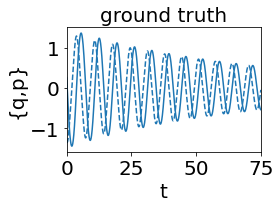

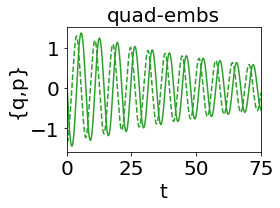

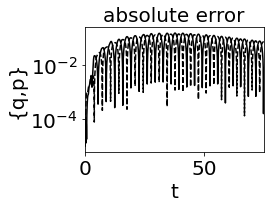

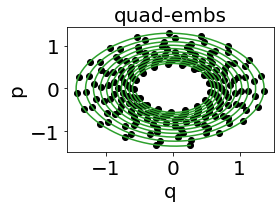

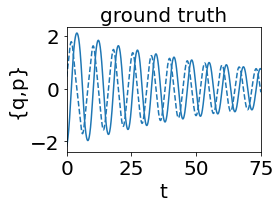

...

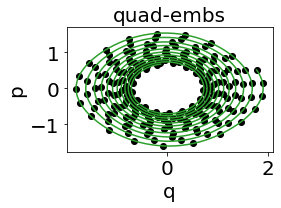

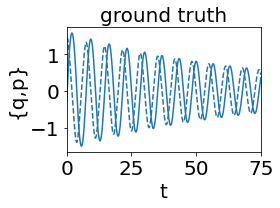

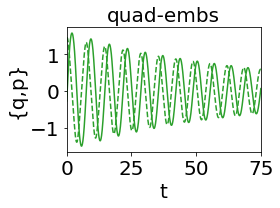

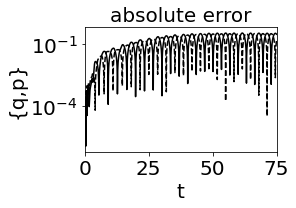

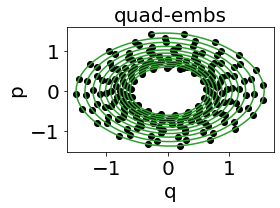

In [10]:
for i in range(params.Ntest):
    
    t_span = [0, 3*params.t_test]
    t = np.linspace(t_span[0], t_span[1], 20*params.sample_size)

    # define initial condition
    y0_test = np.random.uniform(params.smpling_intl[0], params.smpling_intl[1], 2)

    while (
        np.abs(dyn_model_dissipative.potential(y0_test[0], y0_test[1])) > params.max_potential
    ):
        y0_test = np.random.uniform(
            params.smpling_intl[0], params.smpling_intl[1], 2
        )

    y0_test = torch.tensor(y0_test, dtype=torch.float64)
    encoded_initial = autoencoder.encode(y0_test.to(device)).detach().cpu()

    print("Testing the models for initial conditon:", y0_test.numpy())
    print("Encoded initial condition:              ", encoded_initial.numpy())
    print("=" * 50)

    gt_sol = solve_ivp(dyn_model_dissipative.vector_field, t_span = [t[0], t[-1]], y0 = y0_test, t_eval = t)
    gt_sol = gt_sol.y

        
    ground_truth_sol.append(gt_sol)

    
    latent_sol = solve_ivp(learned_model, t_span = [t[0], t[-1]], y0 = encoded_initial.numpy(), t_eval = t)
    latent_sol = latent_sol.y
    
    
    latent_sol = torch.tensor(latent_sol, dtype=torch.float64).to(device)
    decoded_latent_sol = autoencoder.decode(latent_sol.T).detach().T.cpu().numpy()
    learned_sol.append(decoded_latent_sol)

    plot.plotting_saving_plots(
        t,
        gt_sol,
        decoded_latent_sol,
        color_idx=color_idx,
        method_name=method_name,
        idx=i,
        path=params.path,
        closing_plts = False
    )
    
    plotting_saving_plots_phasespace(
        gt_sol,
        decoded_latent_sol,
        color_idx=color_idx,
        method_name=method_name,
        idx=i,
        path=params.path,
        closing_plts = False
    )

    temp_err = gt_sol - decoded_latent_sol
    track_err.append(temp_err)
#     plt.close('all')


In [11]:
learned_sol_stack = np.stack(learned_sol, axis=2)
ground_truth_sol_stack = np.stack(ground_truth_sol, axis=2)

In [12]:
savemat(
    params.path + "sol_trajectories.mat",
    {
        "learned_sol": learned_sol_stack,
        "ground_truth_sol": ground_truth_sol_stack,
        "t": t,
        "err": track_err,
    },
)

In [13]:
ERRS_MEAN = np.array([(err[0]**2).mean() for err in  track_err])
ERRS_MEAN.mean(), ERRS_MEAN.std()

(0.15482100686420494, 0.24959903919459425)

In [14]:
(0.1407878143031353, 0.2287097665923755)

(0.1407878143031353, 0.2287097665923755)